In [2]:
from operator import itemgetter
import os
import csv
import requests
from steam_web_api import Steam
from collections import deque
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from collections import Counter



In [3]:


def get_user_games(steamid, gameList):

    game_list = {game.get("name"): game.get("playtime_forever") for game in gameList}
    return game_list

def get_top_n_most_played(game_list, n=5):
    # Filter out games with 0 playtime
    filtered_games = [game for game in game_list if game.get("playtime_forever", 0) > 0]

    # Sort the filtered games by 'playtime_forever' in descending order
    sorted_games = sorted(filtered_games, key=lambda x: x["playtime_forever"], reverse=True)
    return sorted_games[:n]

def get_friends_games_with_appinfo(steam_id):
    try:
        url = f"https://api.steampowered.com/IPlayerService/GetOwnedGames/v1/"
        params = {
            "key": "709DBFB87328995D4D018ECCCE58F339", 
            "steamid": steam_id,
            "include_appinfo": 1,  # Include game details
            "format": "json",
        }
        response = requests.get(url, params=params)
        response.raise_for_status()
        games = response.json().get("response", {}).get("games", [])
        return games
    except Exception as e:
        print(f"Error fetching games for Steam ID {steam_id}: {e}")
        return []




[{'appid': 10, 'name': 'Counter-Strike', 'playtime_forever': 22, 'img_icon_url': '6b0312cda02f5f777efa2f3318c307ff9acafbb5', 'content_descriptorids': [2, 5]}, {'appid': 80, 'name': 'Counter-Strike: Condition Zero', 'playtime_forever': 48, 'img_icon_url': '077b050ef3e89cd84e2c5a575d78d53b54058236', 'content_descriptorids': [2, 5]}, {'appid': 100, 'name': 'Counter-Strike: Condition Zero Deleted Scenes', 'playtime_forever': 0, 'img_icon_url': '077b050ef3e89cd84e2c5a575d78d53b54058236'}, {'appid': 300, 'name': 'Day of Defeat: Source', 'playtime_forever': 4, 'img_icon_url': '062754bb5853b0534283ae27dc5d58200692b22d', 'has_community_visible_stats': True, 'content_descriptorids': [2, 5]}, {'appid': 20, 'name': 'Team Fortress Classic', 'playtime_forever': 0, 'img_icon_url': '38ea7ebe3c1abbbbf4eabdbef174c41a972102b9', 'content_descriptorids': [2, 5]}]
[{'appid': 4000, 'name': "Garry's Mod", 'playtime_forever': 51, 'img_icon_url': '4a6f25cfa2426445d0d9d6e233408de4d371ce8b', 'has_community_visibl

c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 28526 (\N{CJK UNIFIED IDEOGRAPH-6F6E}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 36215 (\N{CJK UNIFIED IDEOGRAPH-8D77}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 33853 (\N{CJK UNIFIED IDEOGRAPH-843D}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 20102 (\N{CJK UNIFIED IDEOGRAPH-4E86}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Jack\AppData\Local\Programs\Python\Pyth

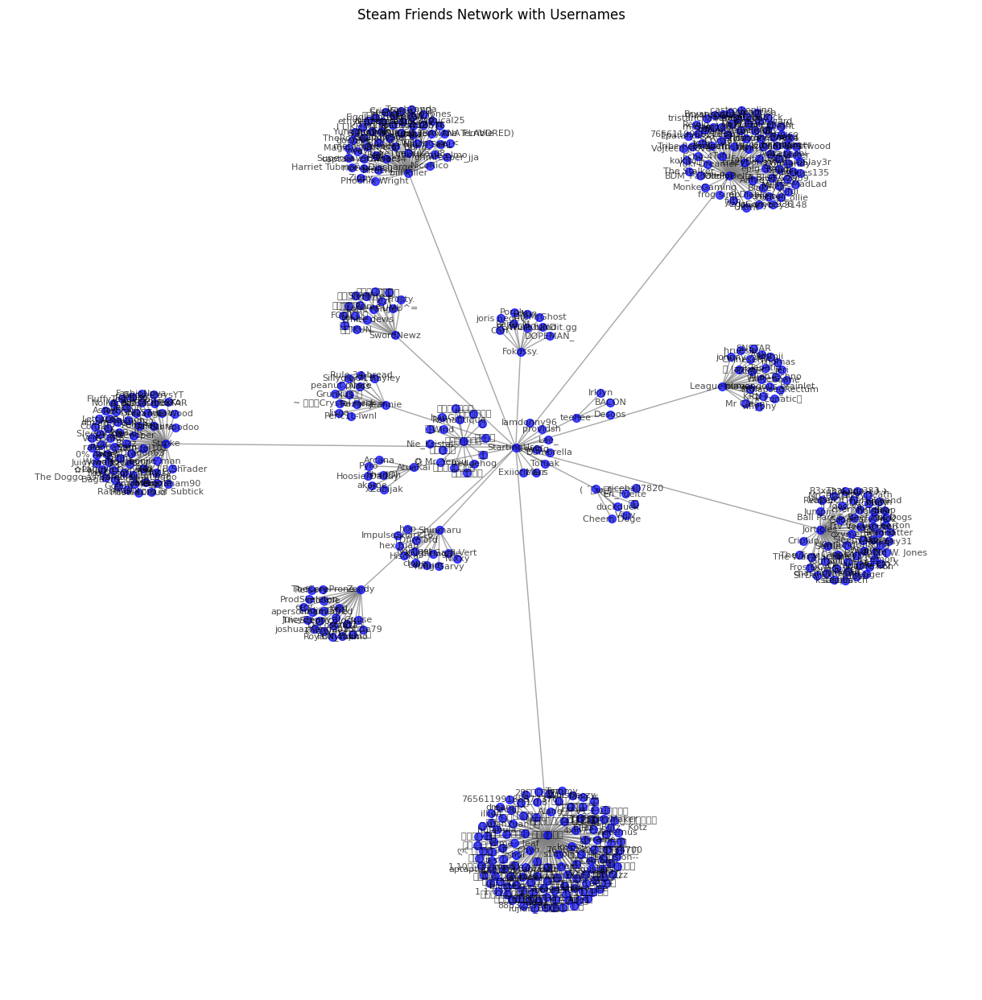

{'76561198798740899': [{'app_id': 1172470, 'name': 'Apex Legends', 'playtime': 92491}, {'app_id': 730, 'name': 'Counter-Strike 2', 'playtime': 43561}, {'app_id': 2073850, 'name': 'THE FINALS', 'playtime': 8211}, {'app_id': 105600, 'name': 'Terraria', 'playtime': 4269}, {'app_id': 431960, 'name': 'Wallpaper Engine', 'playtime': 3441}], '76561198377715433': [{'app_id': 1172470, 'name': 'Apex Legends', 'playtime': 14711}, {'app_id': 291550, 'name': 'Brawlhalla', 'playtime': 14063}, {'app_id': 1245620, 'name': 'ELDEN RING', 'playtime': 5246}, {'app_id': 105600, 'name': 'Terraria', 'playtime': 4933}, {'app_id': 739630, 'name': 'Phasmophobia', 'playtime': 1571}], '76561198858434740': [{'app_id': 291550, 'name': 'Brawlhalla', 'playtime': 25024}, {'app_id': 431730, 'name': 'Aseprite', 'playtime': 10992}, {'app_id': 470220, 'name': 'UNO', 'playtime': 789}, {'app_id': 1150690, 'name': 'OMORI', 'playtime': 223}, {'app_id': 1818750, 'name': 'MultiVersus', 'playtime': 117}], '76561198930001654': [{

In [4]:
import random

# Initialize Steam API
steam = Steam("709DBFB87328995D4D018ECCCE58F339")
def getAllJson(steam_id):
    samplejson = steam.users.get_user_friends_list(steam_id)
    # print("SAMPLE JSON ", samplejson)
    

# Function to get a friend's list safely
def get_friends_list(steam_id):
    try:
        response = steam.users.get_user_friends_list(steam_id)
        return response.get("friends", [])
    except Exception as e:
        print(f"Error fetching friends for {steam_id}: {e}")
        return []

getAllJson("76561199205675029")
# File to save unique users
friends_list_file = "lizziesFriends.csv"

user_map = {}
# Unique users set and queue for BFS
uniqueUser = set()
queue = deque()
edges = []  # To store graph edges

# Starting point
starting_user = "76561198437309923"
starting_username = "StartingUser"  # You can replace this with a hardcoded username for the starting point
queue.append((starting_user, starting_username, 0))

max_users = 500

# BFS traversal
while queue and len(uniqueUser) < max_users:
    current_user, current_username, current_depth = queue.popleft()

    # Check if we reached the max depth
    if current_depth > 10:
        continue

    # Get friends of the current user
    friends = get_friends_list(current_user)
    for friend in friends:
        friend_id = friend.get("steamid", "UnknownID")
        friend_username = friend.get("personaname", friend_id)  # Use personaname if available, fallback to ID

        # Add to unique users and queue if not already visited
        if friend_id not in uniqueUser and friend.get("communityvisibilitystate") == 3:
            games = get_friends_games_with_appinfo(friend_id)
            if len(games) >= 5:  # Check if user owns enough games
                uniqueUser.add(friend_id)
                queue.append((friend_id, friend_username, current_depth + 1))
                edges.append((current_username, friend_username))

                top_games = get_top_n_most_played(games)
                print(games[:5])  # need to double check structure
                user_map[friend_id] = [
                    {"app_id": game["appid"], "name": game["name"], "playtime": game["playtime_forever"]}
                    for game in top_games
                ]

                # Stop if we reach the user limit
                if len(uniqueUser) >= max_users:
                    break

# Save unique users to a CSV file
with open(friends_list_file, "w", newline="") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(["Steam ID", "Username"])
    for user in uniqueUser:
        writer.writerow([user, user])  # No need for additional API calls since we already have usernames

# print(f"Saved {len(uniqueUser)} unique users to {friends_list_file}.")

# Build and visualize the graph
G = nx.Graph()
G.add_edges_from(edges)

# Draw the graph with usernames
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G)  # Position nodes using the spring layout
nx.draw(
    G,
    pos,
    with_labels=True,
    node_size=50,
    font_size=8,
    font_color="black",
    edge_color="gray",
    node_color="blue",
    alpha=0.7
)
plt.title("Steam Friends Network with Usernames")
plt.show()
print(user_map)

In [5]:
data = [
    {
        "user": user_id,
        "game1": games[0]["name"] if len(games) > 0 else None,
        "game2": games[1]["name"] if len(games) > 1 else None,
        "game3": games[2]["name"] if len(games) > 2 else None,
        "game4": games[3]["name"] if len(games) > 3 else None,
        "game5": games[4]["name"] if len(games) > 4 else None,
    }
    for user_id, games in user_map.items()
]

c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 38592 (\N{CJK UNIFIED IDEOGRAPH-96C0}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 39746 (\N{CJK UNIFIED IDEOGRAPH-9B42}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 23558 (\N{CJK UNIFIED IDEOGRAPH-5C06}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 34013 (\N{CJK UNIFIED IDEOGRAPH-84DD}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Jack\AppData\Local\Programs\Python\Pyth

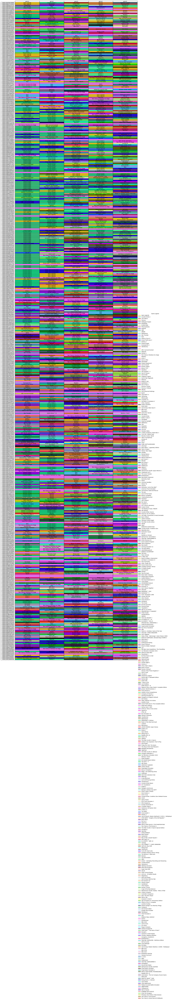

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
import random


# Convert the list of dictionaries into a DataFrame
df = pd.DataFrame(data).set_index('user')

# Initialize a dictionary to store unique game titles and their colors
game_color_map = {}

# Function to generate a random color in hex
def generate_random_color():
    return to_hex([random.random() for _ in range(3)])

# Plot the table
fig, ax = plt.subplots(figsize=(20, 6))
ax.axis('off')  # Hide the axes

# Create the table with colored cells
table = plt.table(
    cellText=df.values,
    colLabels=df.columns,
    rowLabels=df.index,
    loc='center',
    cellLoc='center',
)

# Apply colors to cells, generating a new color for each unique game title
for i, key in enumerate(df.index):
    for j, val in enumerate(df.loc[key]):
        if val != "":
            game_title = val  # Extract the game title
            if game_title not in game_color_map:
                game_color_map[game_title] = generate_random_color()  # Assign a new color if not already in the map
            table[(i + 1, j)].set_facecolor(game_color_map[game_title])  # Apply the color

# Create a legend to map game titles to their colors
legend_elements = [
    plt.Line2D([0], [0], color=color, lw=4, label=game_title)
    for game_title, color in game_color_map.items()
]

# Add the legend to the plot
ax.legend(
    handles=legend_elements,
    loc='upper left',
    bbox_to_anchor=(1, 1),  # Position the legend to the right of the table
    title="Game Legend",
    frameon=False
)

# Adjust the table's layout
table.auto_set_font_size(False)
table.set_fontsize(10)

# Show the plot
plt.show()


In [7]:
import requests
import json
import pandas as pd

API_KEY = "709DBFB87328995D4D018ECCCE58F339"

def get_app_id(game_name):
    try:
        url = "http://api.steampowered.com/ISteamApps/GetAppList/v0002/"
        response = requests.get(url)
        response.raise_for_status()
        data = response.json()
        apps = data.get("applist", {}).get("apps", [])
        
        for app in apps:
            if app.get("name", "").strip().lower() == game_name.strip().lower():
                return app.get("appid")
        
        print(f"App ID not found for game: {game_name}")
        return None
    except Exception as e:
        print(f"Error fetching app_id for game {game_name}: {e}")
        return None
    
def get_game_tags(app_id):
    try:
        app_id = str(app_id)  # why is app_id not a string...
        url = f"https://store.steampowered.com/api/appdetails?appids={app_id}"
        response = requests.get(url)
        response.raise_for_status()
        data = response.json()
        if data.get(app_id, {}).get("success", False):
            genres = data[app_id]["data"].get("genres", [])
            return [genre["description"] for genre in genres]
        else:
            print(f"No data found for app_id {app_id}")
            return []
    except Exception as e:
        print(f"Error fetching tags for app_id {app_id}: {e}")
        return []

# csv -> JSON
def generate_tags_from_user_map(user_map):
    unique_games = {game["app_id"]: game["name"] for games in user_map.values() for game in games}
    all_games = {}

    # Map games to their tags
    for app_id, name in unique_games.items():
        try:
            tags = get_game_tags(app_id)
            all_games[name] = tags
        except Exception as e:
            print(f"Error processing game {name} (App ID {app_id}): {e}")

    return all_games

csv_path = "university_records.csv"

final_tags = generate_tags_from_user_map(user_map)

# Save to JSON file
output_path = "synthetic_game_tags.json"
with open(output_path, "w") as outfile:
    json.dump(final_tags, outfile, indent=4)

print(f"Game tags saved to {output_path}")


No data found for app_id 263280
No data found for app_id 1329410
No data found for app_id 1668940
Error fetching tags for app_id 667970: 429 Client Error: Too Many Requests for url: https://store.steampowered.com/api/appdetails?appids=667970
Error fetching tags for app_id 515180: 429 Client Error: Too Many Requests for url: https://store.steampowered.com/api/appdetails?appids=515180
Error fetching tags for app_id 227940: 429 Client Error: Too Many Requests for url: https://store.steampowered.com/api/appdetails?appids=227940
Error fetching tags for app_id 1465360: 429 Client Error: Too Many Requests for url: https://store.steampowered.com/api/appdetails?appids=1465360
Error fetching tags for app_id 602960: 429 Client Error: Too Many Requests for url: https://store.steampowered.com/api/appdetails?appids=602960
Error fetching tags for app_id 757210: 429 Client Error: Too Many Requests for url: https://store.steampowered.com/api/appdetails?appids=757210
Error fetching tags for app_id 20021

          PC1       PC2               user
0   -0.266498 -0.490258  76561198798740899
1   -0.152721  0.026515  76561198377715433
2   -0.120100  0.028220  76561198858434740
3   -0.170205  0.059107  76561198930001654
4   -0.337571 -0.981210  76561199010931665
..        ...       ...                ...
495  2.070646 -0.059608  76561199094316345
496 -0.171451 -0.038301  76561198996191607
497 -0.131712  0.027025  76561199151850827
498 -0.119239  0.027994  76561198283344501
499 -0.149586 -0.029082  76561199229808398

[500 rows x 3 columns]


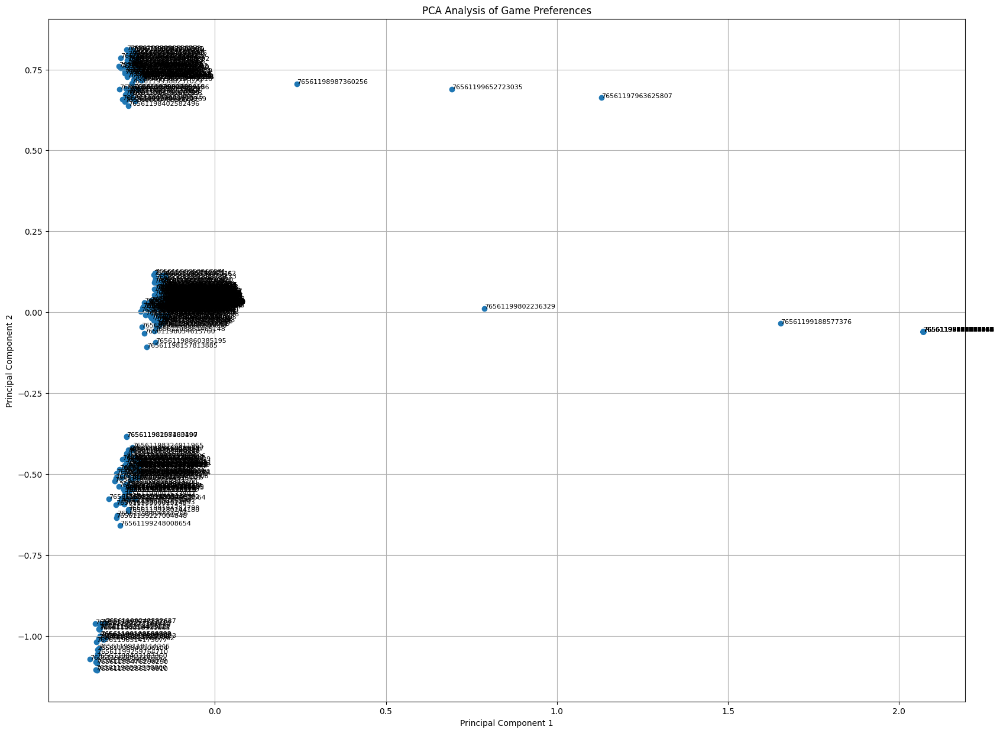

In [8]:

df = pd.DataFrame(data)

# Extract game columns and encode them
game_columns = ['game1', 'game2', 'game3', 'game4', 'game5']
encoder = OneHotEncoder()
encoded_games = encoder.fit_transform(df[game_columns]).toarray()

# Perform PCA
pca = PCA(n_components=2)  # Reduce to 2 components for visualization
pca_result = pca.fit_transform(encoded_games)

# Add PCA results to the DataFrame
df_pca = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
df_pca['user'] = df['user']

# Display PCA results
print(df_pca)

# Plot PCA results
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 15))
plt.scatter(df_pca['PC1'], df_pca['PC2'])

# Annotate points with user IDs
for i, user_id in enumerate(df_pca['user']):
    plt.text(df_pca['PC1'][i], df_pca['PC2'][i], user_id, fontsize=8)

plt.title('PCA Analysis of Game Preferences')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()


In [9]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import plotly.express as px
import json

# Load game tags
with open("synthetic_game_tags.json", "r") as f:
    game_tags = json.load(f)

all_tags = sorted({tag for tags in game_tags.values() for tag in tags})

# Step 2: Create a binary tag matrix
game_names = list(game_tags.keys())
tag_matrix = np.array([
    [1 if tag in game_tags[game] else 0 for tag in all_tags]
    for game in game_names
])

# Step 3: Calculate pairwise cosine similarities
similarity_matrix = cosine_similarity(tag_matrix)

# Step 4: Filter games based on similarity threshold
similarity_threshold = 0.9  # Adjust as needed
high_similarity_indices = np.where(similarity_matrix >= similarity_threshold)
filtered_indices = set(high_similarity_indices[0])  # Indices of games with high similarity
filtered_tag_matrix = tag_matrix[list(filtered_indices)]
filtered_game_names = [game_names[i] for i in filtered_indices]
filtered_game_tags = [", ".join(game_tags[game]) for game in filtered_game_names]

# Step 5: Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=3, perplexity=5, random_state=42)
tsne_result = tsne.fit_transform(filtered_tag_matrix)

# Step 6: Apply k-means clustering on the filtered t-SNE result
kmeans = KMeans(n_clusters=15, random_state=42)
kmeans_labels = kmeans.fit_predict(tsne_result)

# Step 7: Create interactive 3D scatter plot with Plotly
fig = px.scatter_3d(
    x=tsne_result[:, 0], 
    y=tsne_result[:, 1], 
    z=tsne_result[:, 2],
    color=kmeans_labels.astype(str),
    hover_name=filtered_game_names,
    hover_data={"Tags": filtered_game_tags},  # Add tags to hover data
    title="t-SNE with k-Means Clustering of Similar Games (Interactive 3D)",
    labels={'color': 'Cluster'}
)

fig.update_traces(marker=dict(size=7))
fig.update_layout(
    scene=dict(
        xaxis_title='t-SNE Dimension 1',
        yaxis_title='t-SNE Dimension 2',
        zaxis_title='t-SNE Dimension 3'
    ),
    width=1600,
    height=900
)

fig.show()


c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 38592 (\N{CJK UNIFIED IDEOGRAPH-96C0}) missing from font(s) DejaVu Sans.

c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 39746 (\N{CJK UNIFIED IDEOGRAPH-9B42}) missing from font(s) DejaVu Sans.

c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 40635 (\N{CJK UNIFIED IDEOGRAPH-9EBB}) missing from font(s) DejaVu Sans.

c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 23558 (\N{CJK UNIFIED IDEOGRAPH-5C06}) missing from font(s) DejaVu Sans.

c:\Users\Jack\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 34013 (\N{CJK UNIFIED IDEOGRAPH-84DD}) missing from font(s) DejaVu Sans.

c:\Users\J

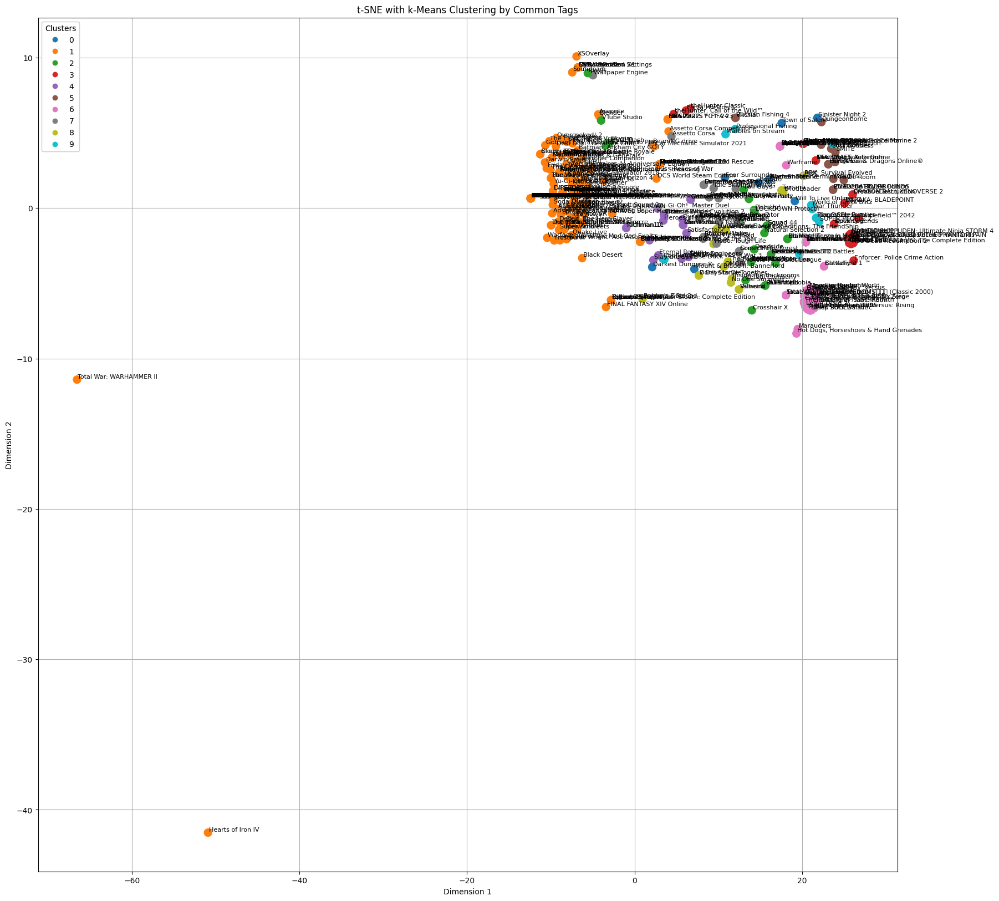

Number of games in game_names: 413
Number of clusters in kmeans_labels: 413


In [10]:



# Create a tag frequency matrix
with open("synthetic_game_tags.json", "r") as f:
    game_tags = json.load(f)

all_tags = sorted({tag for tags in game_tags.values() for tag in tags})

game_names = list(game_tags.keys())
tag_matrix = np.array([
    [1 if tag in game_tags[game] else 0 for tag in all_tags]
    for game in game_names
])

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_result = tsne.fit_transform(tag_matrix)

# Apply k-means clustering
kmeans = KMeans(n_clusters=10, random_state=42)
kmeans_labels = kmeans.fit_predict(tag_matrix)

# Visualize the results
plt.figure(figsize=(20, 20))
scatter = plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=kmeans_labels, cmap='tab10', s=100)
plt.title('t-SNE with k-Means Clustering by Common Tags')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.grid()

# Add game annotations
for i, game in enumerate(game_names):
    plt.annotate(game, (tsne_result[i, 0] + 0.1, tsne_result[i, 1] + 0.1), fontsize=8)

# Add legend for clusters
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

plt.show()

#testing this because I think game names don't match with the clusters lol

print(f"Number of games in game_names: {len(game_names)}")
print(f"Number of clusters in kmeans_labels: {len(kmeans_labels)}")



In [11]:


all_users = list(user_map.keys())
random.shuffle(all_users)
testUsers = all_users[:5]
trainUsers = all_users[5:]


def recommendation(test_users, top_n=5):
    results = {}
    
    for user in test_users:
        # Get the user's top games
        user_top_games = [game["name"] for game in user_map[user] if "name" in game]
        print(f"Processing recommendations for user {user}. Top games: {user_top_games}")
        
        # Find clusters for the user's top games
        user_clusters = set()
        for game in user_top_games:
            if game in game_names:
                idx = game_names.index(game)
                user_clusters.add(kmeans_labels[idx])
            else:
                print(f"{game} from user {user} is missing in game_names.")
        
        # Filter games within the same clusters
        candidate_games = [game_names[i] for i in range(len(game_names)) if kmeans_labels[i] in user_clusters]
        candidate_vectors = np.array([tag_matrix[i] for i in range(len(game_names)) if kmeans_labels[i] in user_clusters])
        
        # Debugging to check clusters and recommended games
        print(f"User {user} clusters: {user_clusters}")
        print(f"Candidate games for user {user}: {candidate_games[:10]}")
        
        # Aggregate tags for the user's top games
        user_tags = []
        for game in user_top_games:
            if game in game_tags:
                user_tags.extend(game_tags[game])
        
        # If no recommended games -> submit popular games (this condition should not go through)
        if not candidate_games:
            print(f"No recommended games found for user {user}. Recommending popular games instead.")
            top_games = [game for game, _ in Counter(game_names).most_common(top_n)]
            results[user] = top_games
            continue
        
        # Create a vector for the user's tags
        user_vector = [1 if tag in user_tags else 0 for tag in all_tags]
        user_vector = np.array(user_vector).reshape(1, -1)
        
        # Compute cosine similarity
        similarity_scores = cosine_similarity(user_vector, candidate_vectors)
        top_indices = similarity_scores.argsort()[0, -top_n:][::-1]
        recommended_games = [candidate_games[i] for i in top_indices]
        
        results[user] = recommended_games
    
    return results

testResults = recommendation(testUsers)

# Display recommendations for all test users
for test_user, recommended_games in testResults.items():
    print(f"Test User: {test_user}")
    print(f"Recommended Games: {recommended_games}")
    print()


Processing recommendations for user 76561198849106104. Top games: ['Dread Hunger', 'Counter-Strike 2', 'Wallpaper Engine', 'Battlefield™ 2042', 'PUBG: BATTLEGROUNDS']
User 76561198849106104 clusters: {np.int32(2), np.int32(3), np.int32(5), np.int32(6), np.int32(7)}
Candidate games for user 76561198849106104: ['Apex Legends', 'Counter-Strike 2', 'THE FINALS', 'Wallpaper Engine', 'Brawlhalla', 'ELDEN RING', 'Phasmophobia', 'MultiVersus', 'Grand Theft Auto V', 'Destiny 2']
Processing recommendations for user 76561198240687714. Top games: ['Counter-Strike 2', 'Rocket League', 'Apex Legends', 'Bloons TD 6', 'Paladins']
User 76561198240687714 clusters: {np.int32(1), np.int32(2), np.int32(3), np.int32(5), np.int32(6)}
Candidate games for user 76561198240687714: ['Apex Legends', 'Counter-Strike 2', 'THE FINALS', 'Brawlhalla', 'ELDEN RING', 'Phasmophobia', 'Aseprite', 'UNO', 'MultiVersus', 'Hearts of Iron IV']
Processing recommendations for user 76561199238446712. Top games: ['Dread Hunger', 'P